In [1]:
# Importation des bibliothèques nécessaires
from sklearn.model_selection import train_test_split

In [2]:
# Importation des algorithmes de classifications
from sans_caracteres import SansCaracteres
from arbre_de_decision import ArbreDeDecision
from regression_logisitique import RegressionLogistique
from perceptron_classification import PerceptronClassifier
from svm import SVMClassifier
from reseau_de_neuronnes import ReseauxDeNeuronnes

# Choix des algorithmes, commentez ceux que vous ne voulez pas lancer
algorithmes = {
    "Sans Caracteres": SansCaracteres(),
    "Arbre de décision": ArbreDeDecision(),
    "Régression Logistique": RegressionLogistique(),
    "Perceptron": PerceptronClassifier(),
    "SVM": SVMClassifier(),
    "Réseau de Neurones": ReseauxDeNeuronnes()
}

In [3]:
# Importation des classes de traitement des données
from pretraitement import Pretraitement
from evaluation import Evaluation

# Manipulation des données sans prétraitement

In [5]:
# Initialisation des données
pretraitement = Pretraitement("train.csv")
x, y = pretraitement.mise_en_forme()

In [5]:
## Entraînement selon le dictionnaire d'algorithme
# On divise les données entre les données de test et d'entraînement
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

# Lancement de l'entraînement et de l'évaluation associé
for nom, algo in algorithmes.items():
    algo.fit(x_train, y_train)  # Entraînement
    # Si souhaité décommentez les deux lignes suivantes, 
    # afin de connaître les hyperparamètres optimaux
    #if nom !="Sans Caracteres":
    #    print("Les meilleurs hyperparamètre du modèle",nom, "sont", algo.model.get_params())
eval_algo_comparaison = Evaluation(x_test, y_test, algorithmes)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Fitting 5 folds for each of 96 candidates, totalling 480 fits
Fitting 5 folds for each of 216 candidates, totalling 1080 fits


In [6]:
eval_algo_comparaison.calculate_metrics()


{'Sans Caracteres': {'Precision': np.float64(0.0001020304050607081),
  'Recall': np.float64(0.010101010101010102),
  'F1-Score': np.float64(0.00020202020202020202)},
 'Arbre de décision': {'Precision': np.float64(0.6474747474747474),
  'Recall': np.float64(0.6262626262626263),
  'F1-Score': np.float64(0.6088263588263588)},
 'Régression Logistique': {'Precision': np.float64(0.8228956228956229),
  'Recall': np.float64(0.7929292929292929),
  'F1-Score': np.float64(0.7768638768638769)},
 'Perceptron': {'Precision': np.float64(0.8151755651755651),
  'Recall': np.float64(0.8181818181818182),
  'F1-Score': np.float64(0.7920314253647587)},
 'SVM': {'Precision': np.float64(0.9343434343434344),
  'Recall': np.float64(0.9242424242424242),
  'F1-Score': np.float64(0.9168350168350168)},
 'Réseau de Neurones': {'Precision': np.float64(0.9158249158249159),
  'Recall': np.float64(0.8888888888888888),
  'F1-Score': np.float64(0.8824915824915824)}}

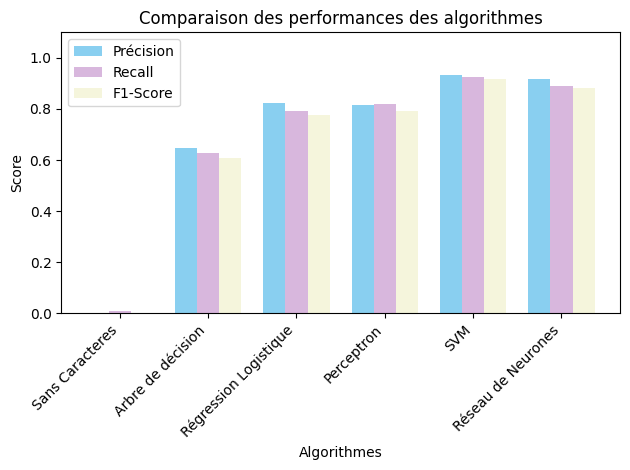

In [7]:
eval_algo_comparaison.plot_metrics()

[[9.79884279e-05 1.77400612e-07 9.92601448e-01 ... 2.20295088e-10
  1.81574211e-06 5.20323283e-07]
 [2.90670848e-16 1.29737356e-14 8.10889542e-19 ... 1.06784914e-21
  1.49440828e-22 6.58979506e-13]
 [3.09327570e-06 6.31867707e-15 2.12557181e-10 ... 1.06981876e-03
  1.18821115e-05 1.36168411e-12]
 ...
 [2.89101381e-17 4.31094953e-06 2.23337731e-13 ... 3.40190455e-15
  5.26568555e-14 1.39033520e-14]
 [7.55314732e-10 2.65603687e-11 4.98842873e-13 ... 5.72397193e-06
  7.61462024e-12 2.17951160e-07]
 [2.47496704e-12 2.55505245e-12 2.27500877e-09 ... 1.50349889e-13
  2.54160152e-08 1.58098765e-13]]


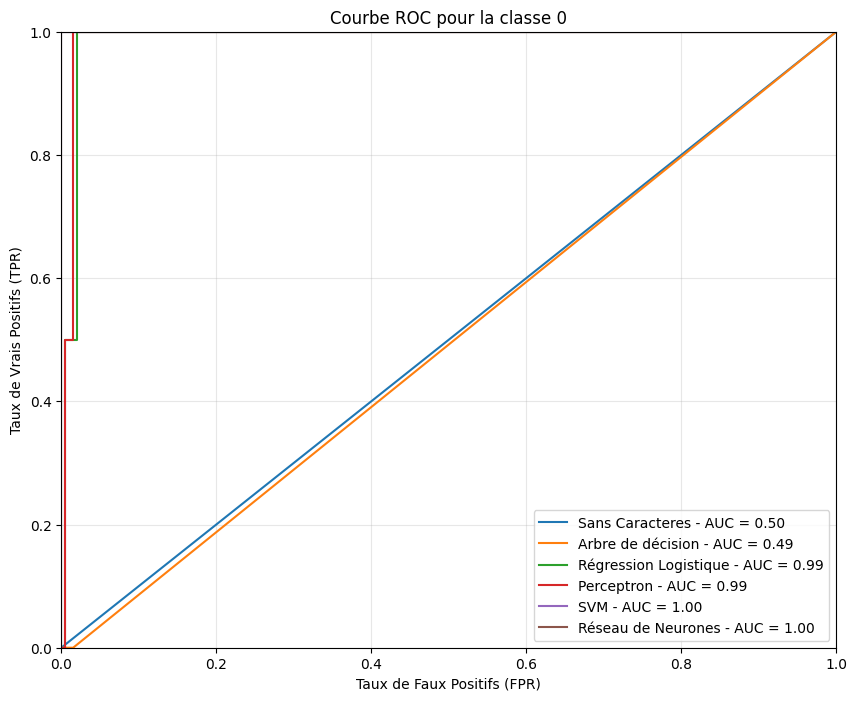

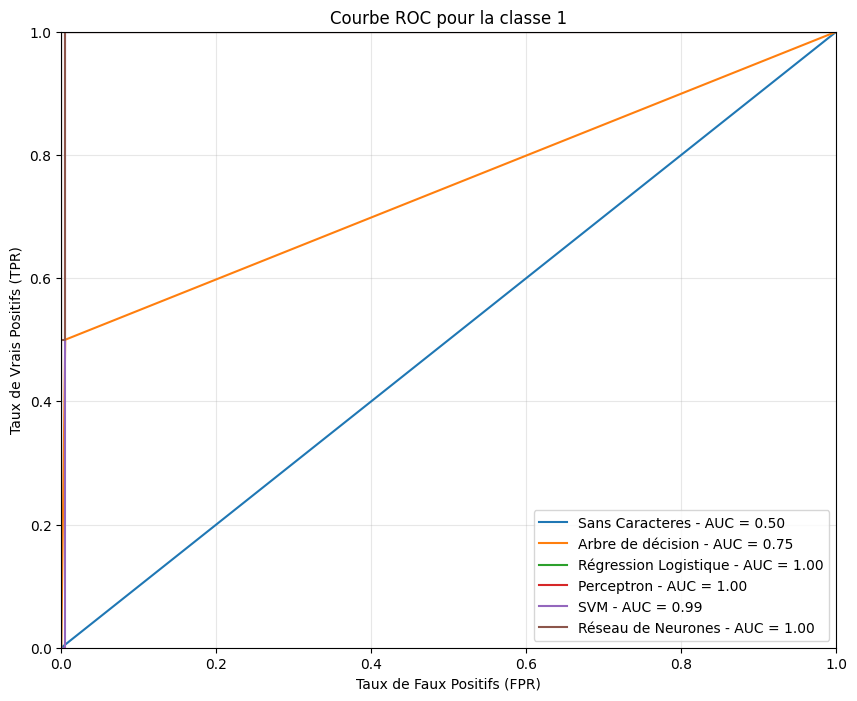

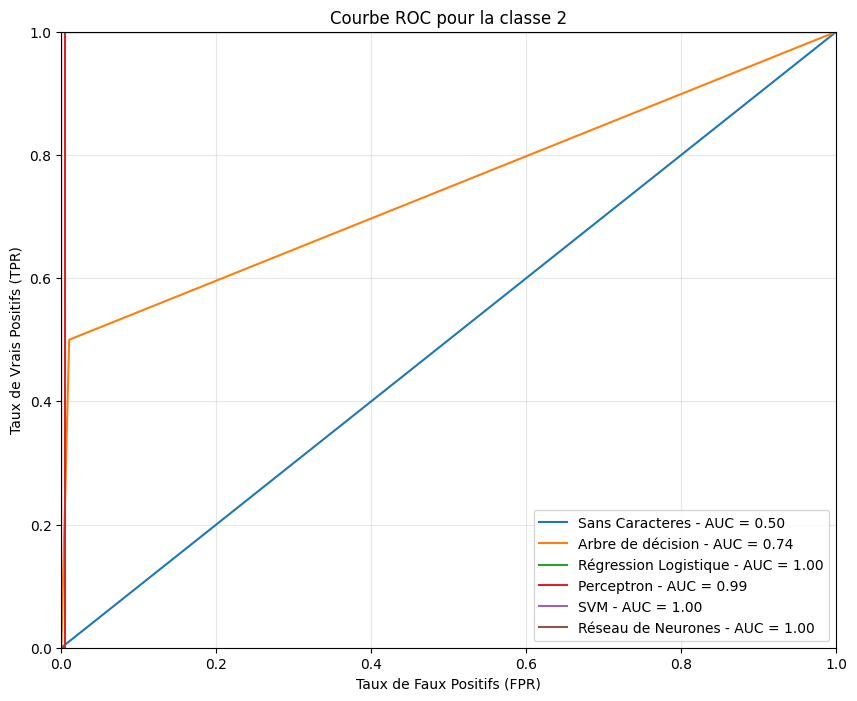

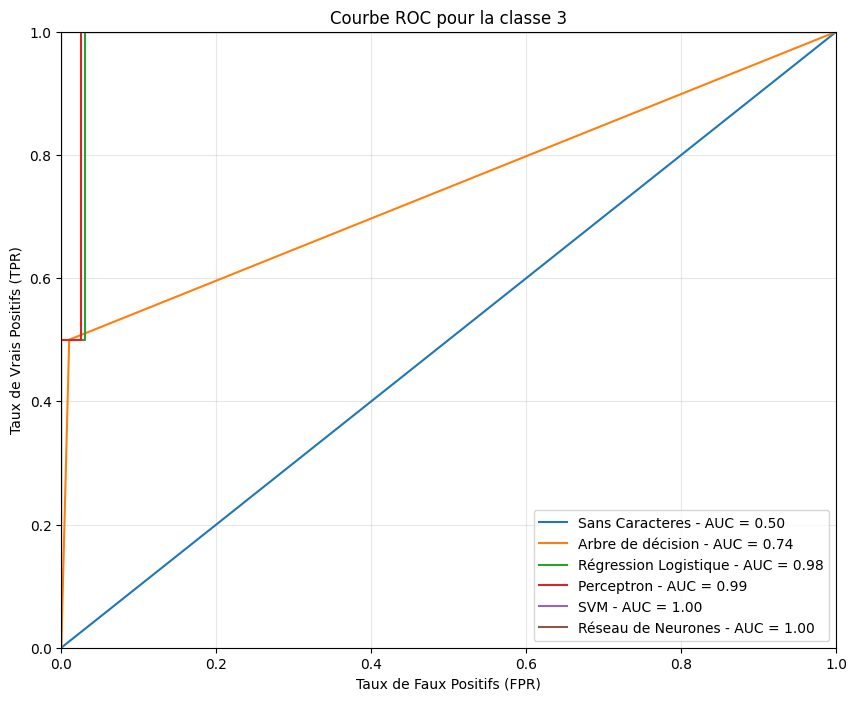

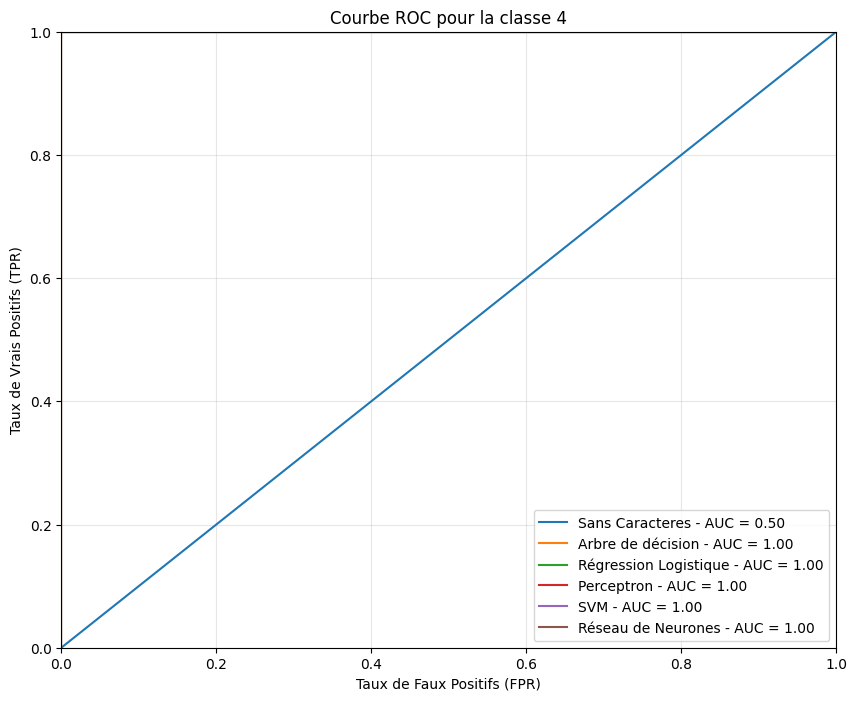

...

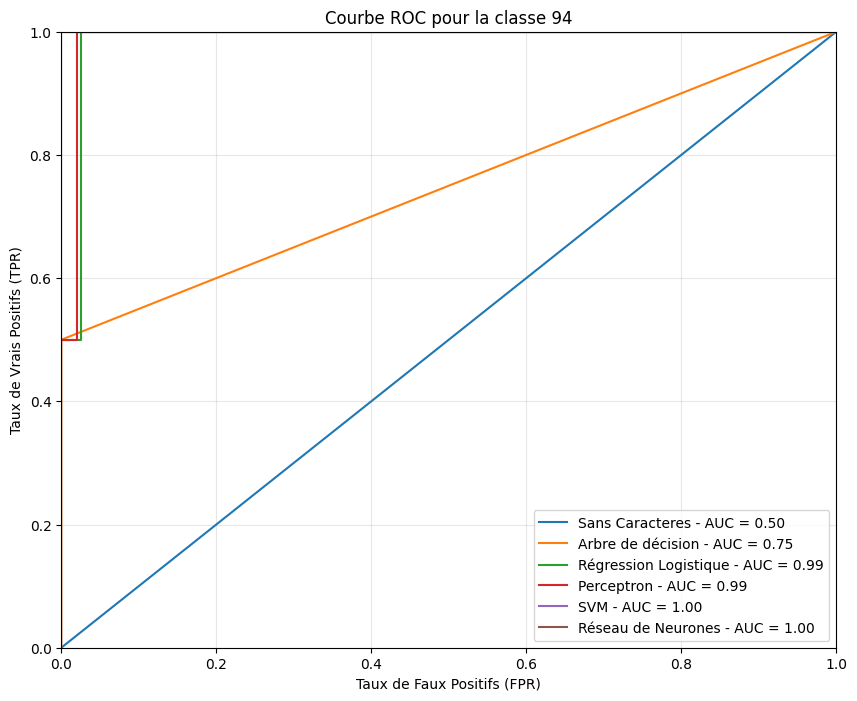

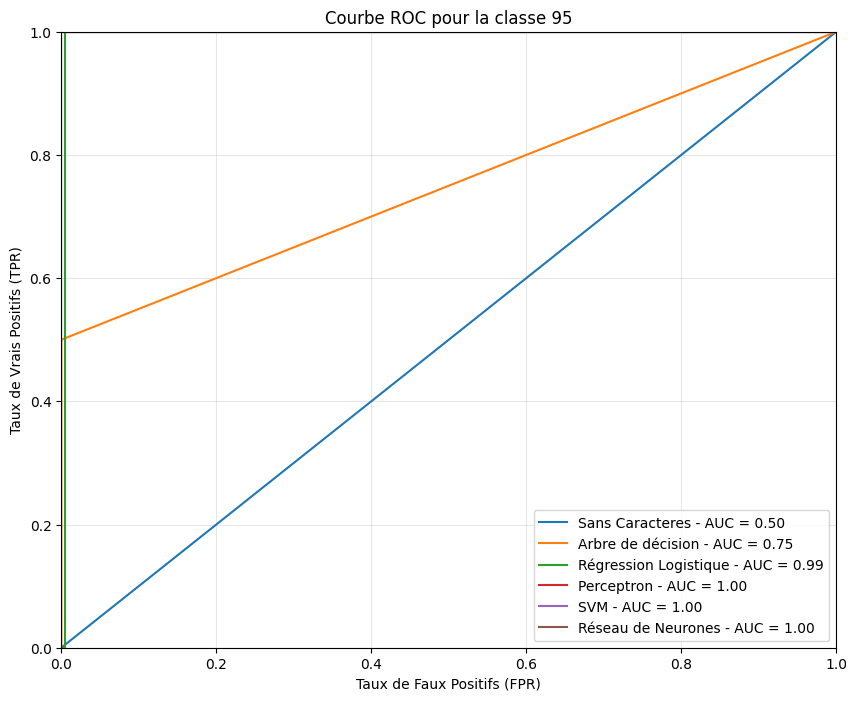

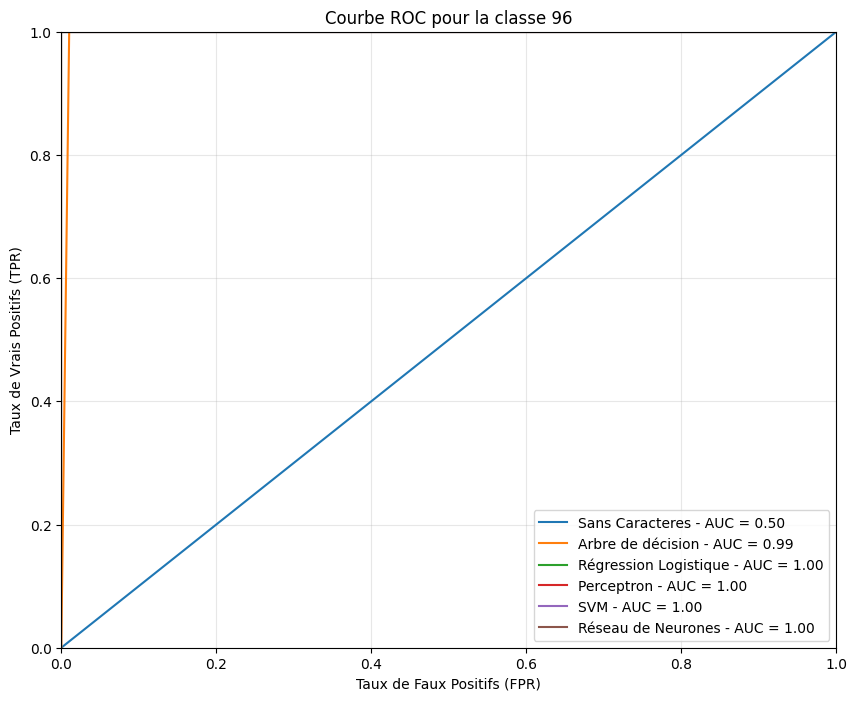

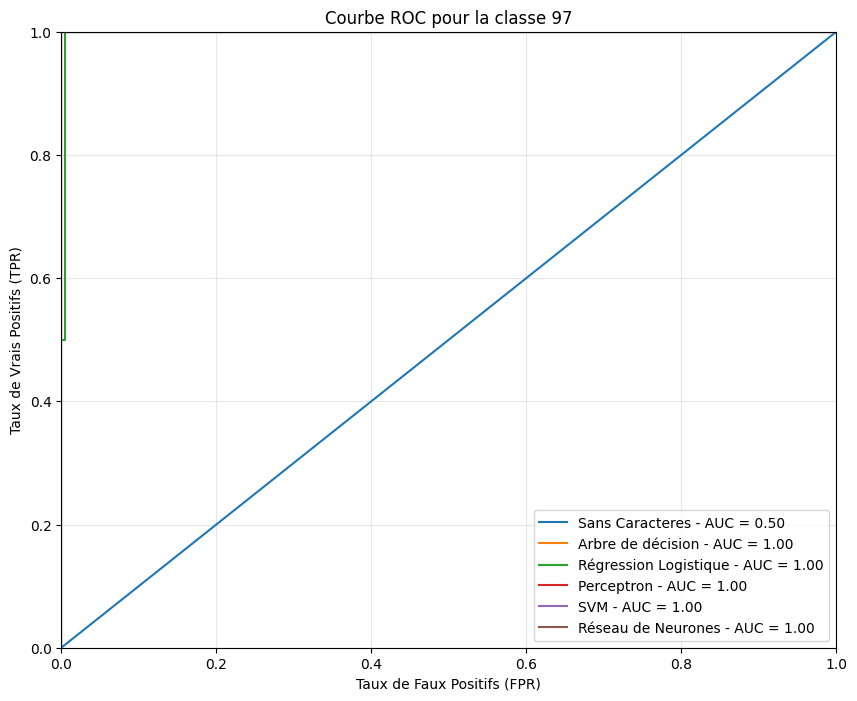

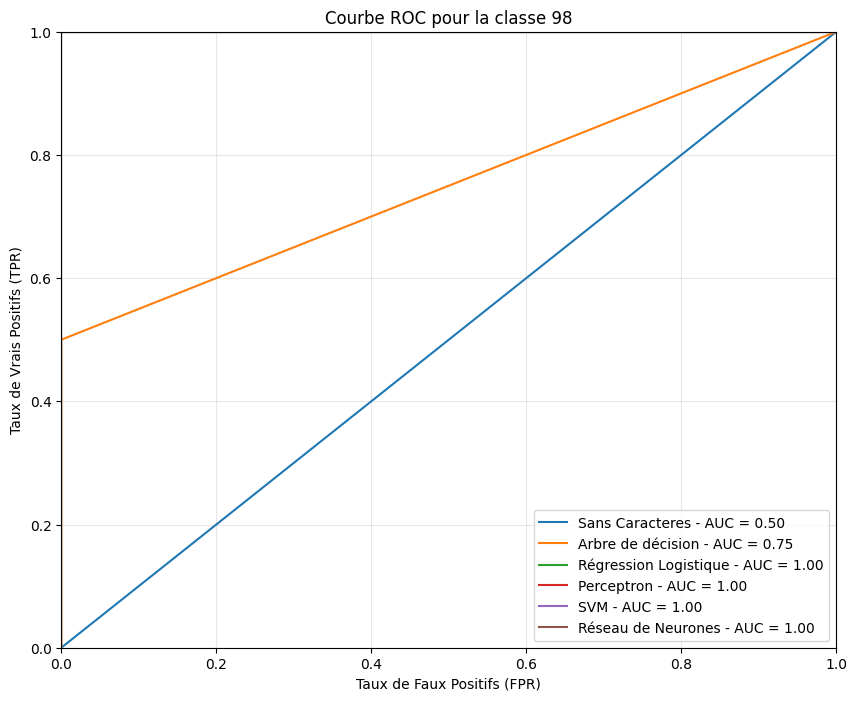

In [8]:
eval_algo_comparaison.roc_par_classe(y_test)

# Manipulation des données après une standardisation

In [6]:
# Standardisation des données
x_standardized = pretraitement.standardisation(x)

# Manipulation des données après une transformation ACP

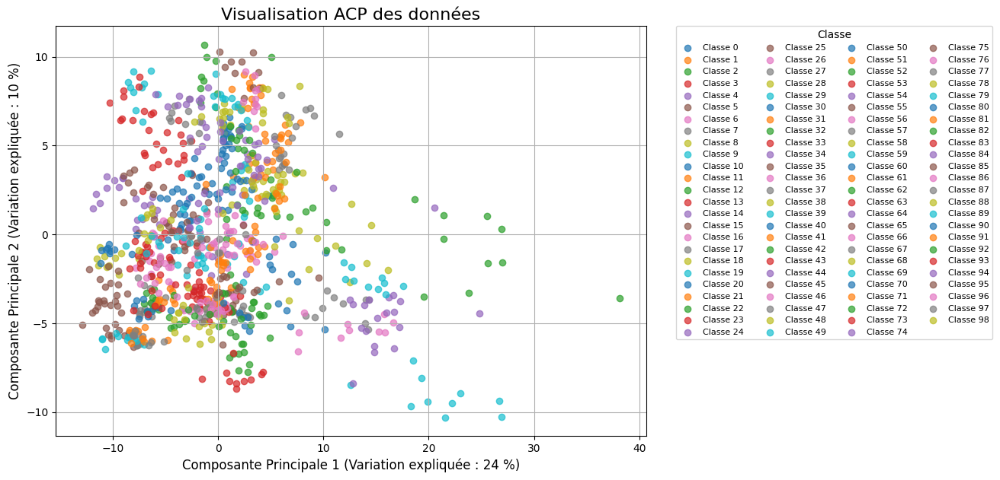

In [7]:
# Réduction des dimensions avec PCA
reduced_data = pretraitement.pca(x_standardized, n_composantes=2, graph=True)

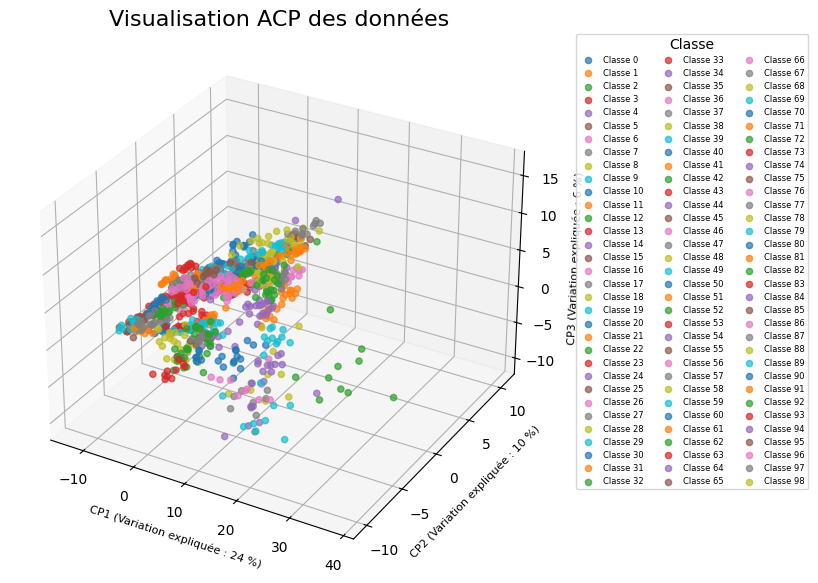

In [8]:
# Réduction des dimensions avec PCA
reduced_data = pretraitement.pca(x_standardized, n_composantes=3, graph=True)

In [12]:
x_pca = pretraitement.pca(x_standardized, n_composantes=139, graph=False)


In [13]:
## Entraînement selon le dictionnaire d'algorithme
# On divise les données entre les données de test et d'entraînement
x_train, x_test, y_train, y_test = train_test_split(
    x_pca, y, test_size=0.2, random_state=42, stratify=y
)

# Entraînement et évaluation des algorithmes
for nom, algo in algorithmes.items():
    algo.fit(x_train, y_train)  # Entraînement
    print(f"Modèle {nom} entraîné.")
    # Si on souhaite afficher les meilleurs hyperparamètres :
    #if nom !="Sans Caracteres":
    #    print("Les meilleurs hyperparamètre du modèle",nom, "sont", algo.model.get_params())

# Évaluation comparative des algorithmes
eval_algo_comparaison = Evaluation(x_test, y_test, algorithmes)

Modèle Sans Caracteres entraîné.
Fitting 5 folds for each of 108 candidates, totalling 540 fits
Modèle Arbre de décision entraîné.
Fitting 5 folds for each of 96 candidates, totalling 480 fits


/home/arthur/Desktop/projet-kaggle/.venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/arthur/Desktop/projet-kaggle/.venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/arthur/Desktop/projet-kaggle/.venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/arthur/Desktop/projet-kaggle/.venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/arthur/Desktop/projet-kaggle/.venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not c

Modèle Régression Logistique entraîné.
Modèle Perceptron entraîné.
Modèle SVM entraîné.
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Modèle Réseau de Neurones entraîné.


In [14]:
eval_algo_comparaison.calculate_metrics()


{'Sans Caracteres': {'Precision': np.float64(0.0001020304050607081),
  'Recall': np.float64(0.010101010101010102),
  'F1-Score': np.float64(0.00020202020202020202)},
 'Arbre de décision': {'Precision': np.float64(0.9747474747474747),
  'Recall': np.float64(0.9747474747474747),
  'F1-Score': np.float64(0.9703703703703703)},
 'Régression Logistique': {'Precision': np.float64(0.9966329966329966),
  'Recall': np.float64(0.9949494949494949),
  'F1-Score': np.float64(0.9946127946127946)},
 'Perceptron': {'Precision': np.float64(0.24667308000641333),
  'Recall': np.float64(0.22727272727272727),
  'F1-Score': np.float64(0.21700578351296057)},
 'SVM': {'Precision': np.float64(1.0),
  'Recall': np.float64(1.0),
  'F1-Score': np.float64(1.0)},
 'Réseau de Neurones': {'Precision': np.float64(0.9831649831649832),
  'Recall': np.float64(0.9747474747474747),
  'F1-Score': np.float64(0.9730639730639732)}}

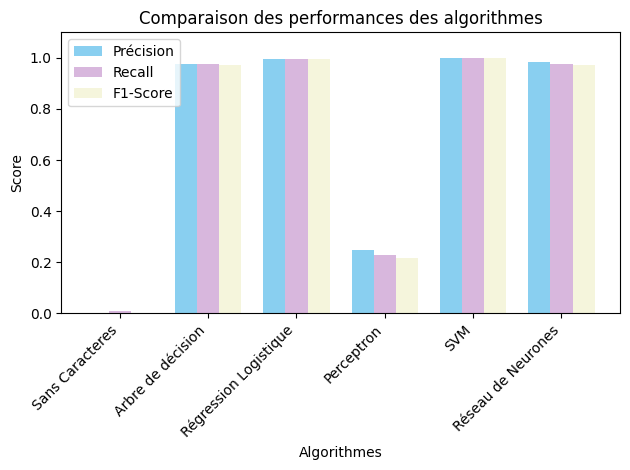

In [15]:
eval_algo_comparaison.plot_metrics()

/home/arthur/Desktop/projet-kaggle/perceptron_classification.py:76: RuntimeWarning: overflow encountered in exp
  probabilities = 1 / (1 + np.exp(-decision_scores))  # Sigmoid pour chaque score de décision


[[8.00948262e-03 3.74325744e-03 7.97974523e-01 ... 3.20485748e-05
  8.45174169e-05 8.04043150e-05]
 [3.59264276e-03 1.70622774e-03 4.44273866e-03 ... 9.64720112e-04
  1.31090669e-03 6.22948418e-03]
 [4.64559242e-04 2.89005830e-05 5.61996048e-05 ... 3.59622602e-02
  3.20764957e-02 7.50345474e-03]
 ...
 [4.25611477e-04 7.74811142e-04 4.97825808e-04 ... 4.40947583e-03
  8.97422597e-03 1.45129247e-02]
 [7.21227892e-03 3.36646051e-03 6.80842917e-03 ... 3.83861165e-04
  3.01280119e-04 9.75690139e-05]
 [6.04661151e-04 1.10360946e-04 1.58790391e-04 ... 1.59864705e-02
  1.79714522e-02 2.10919349e-03]]


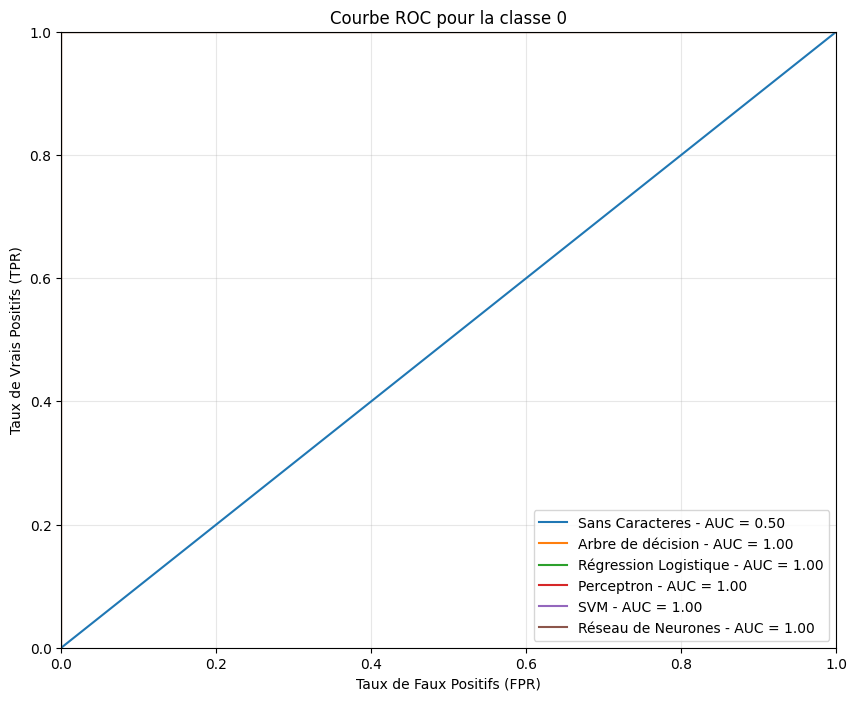

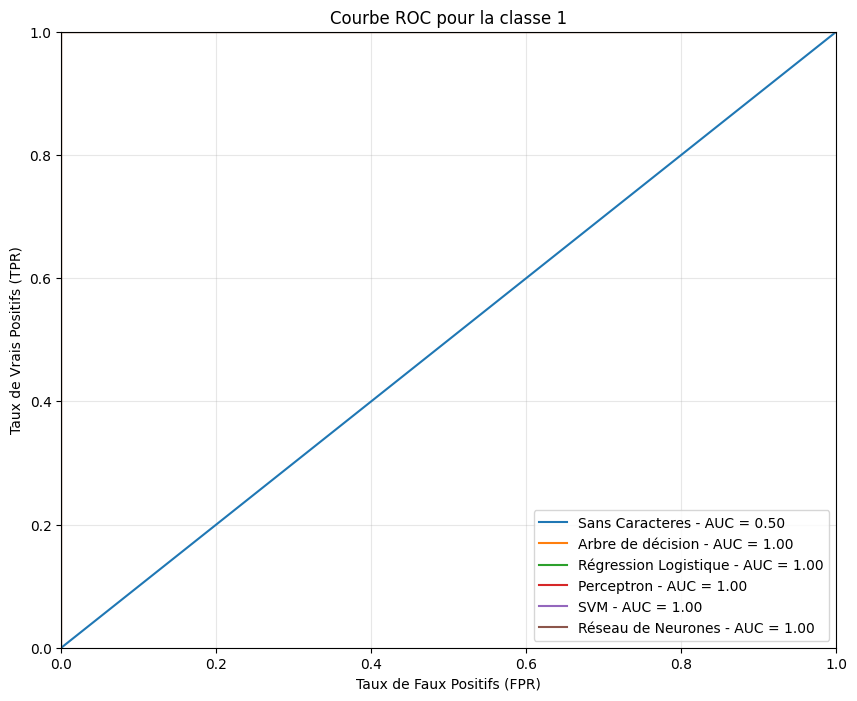

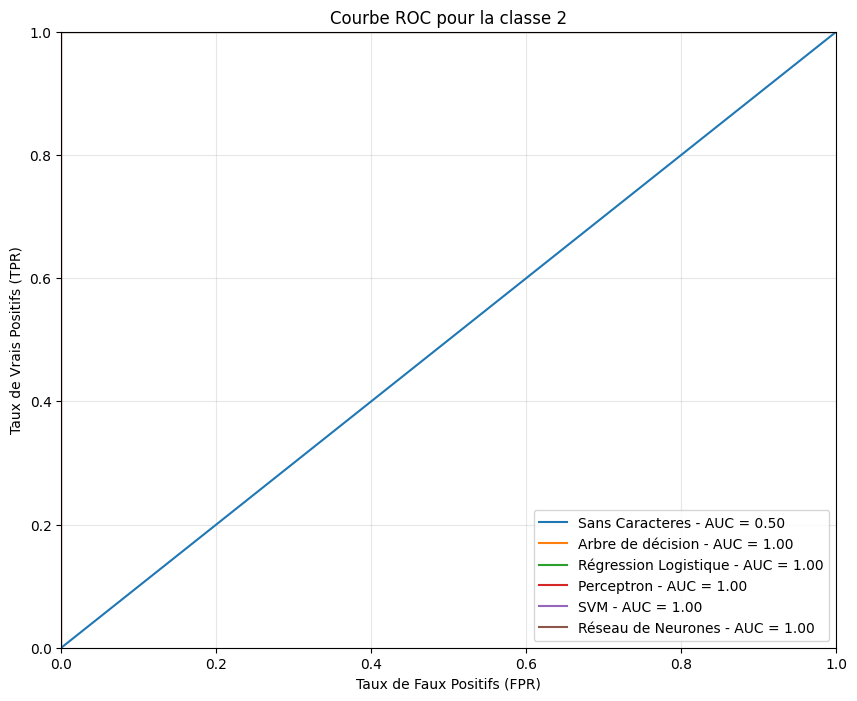

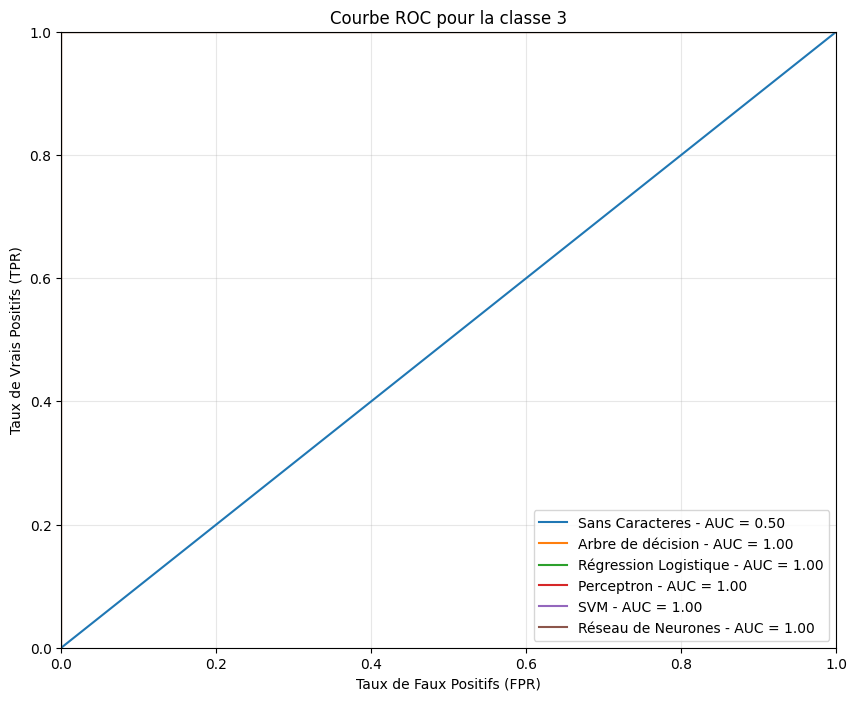

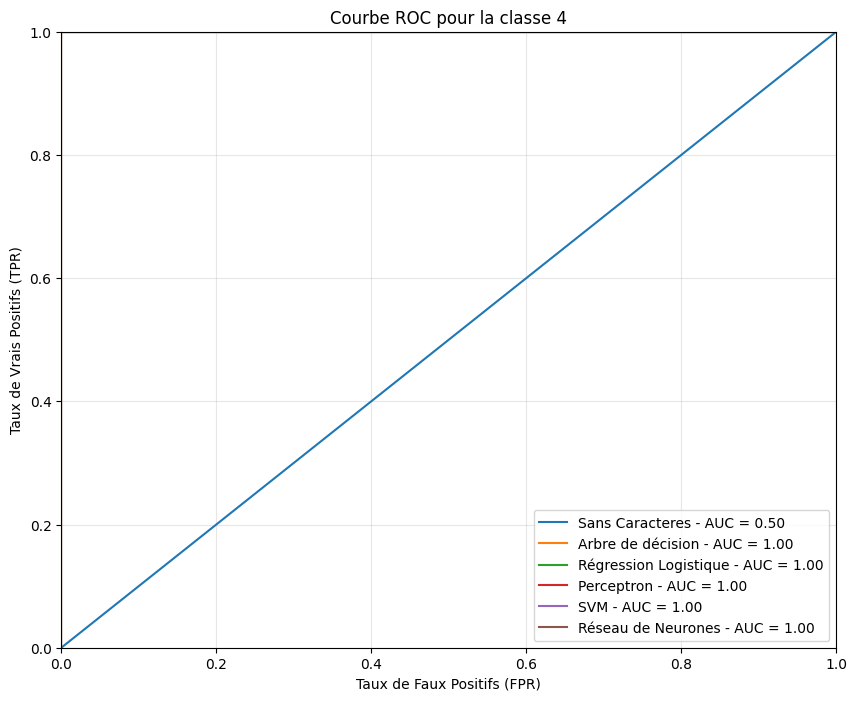

...

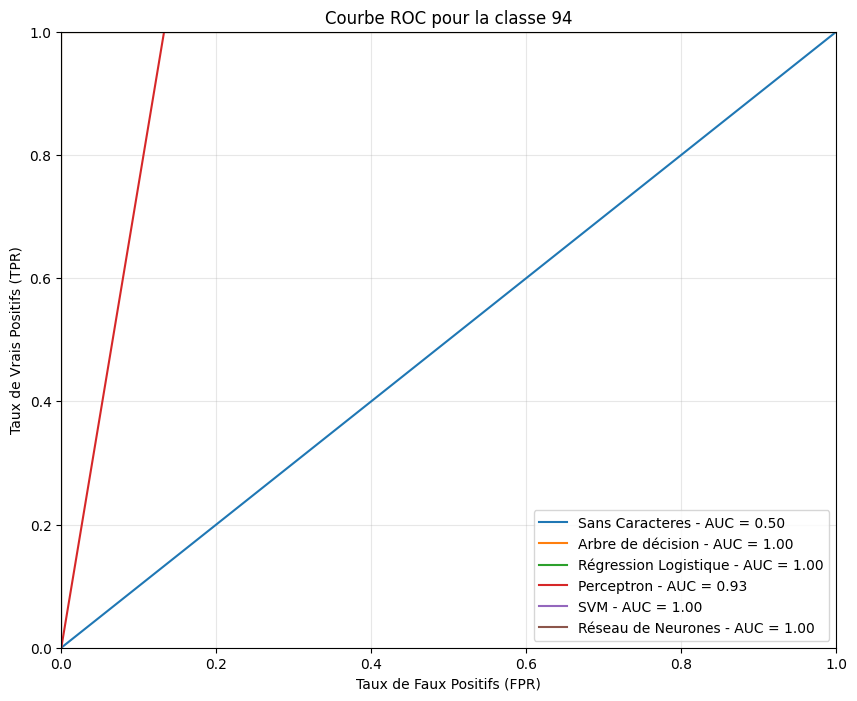

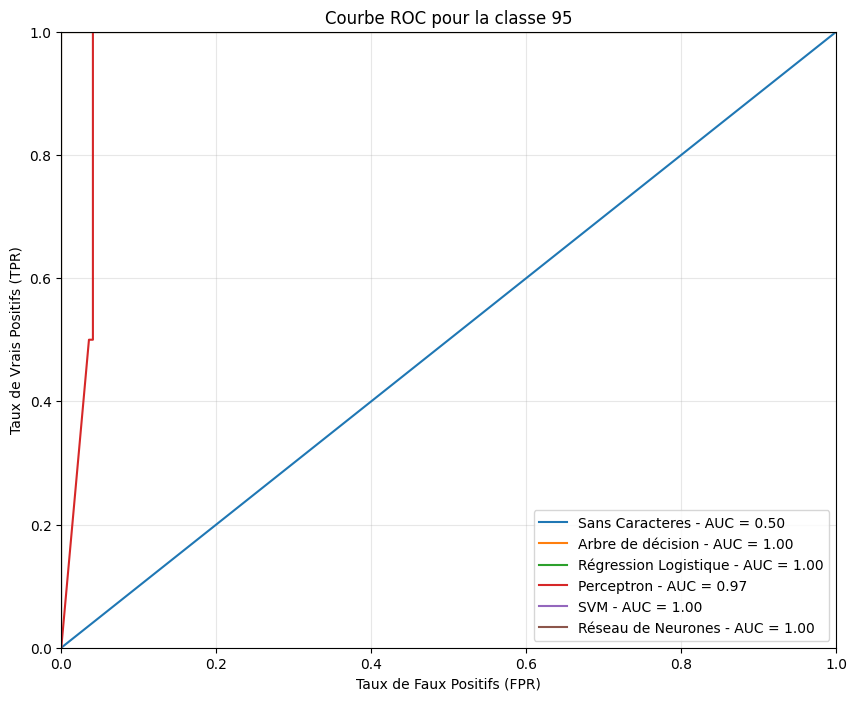

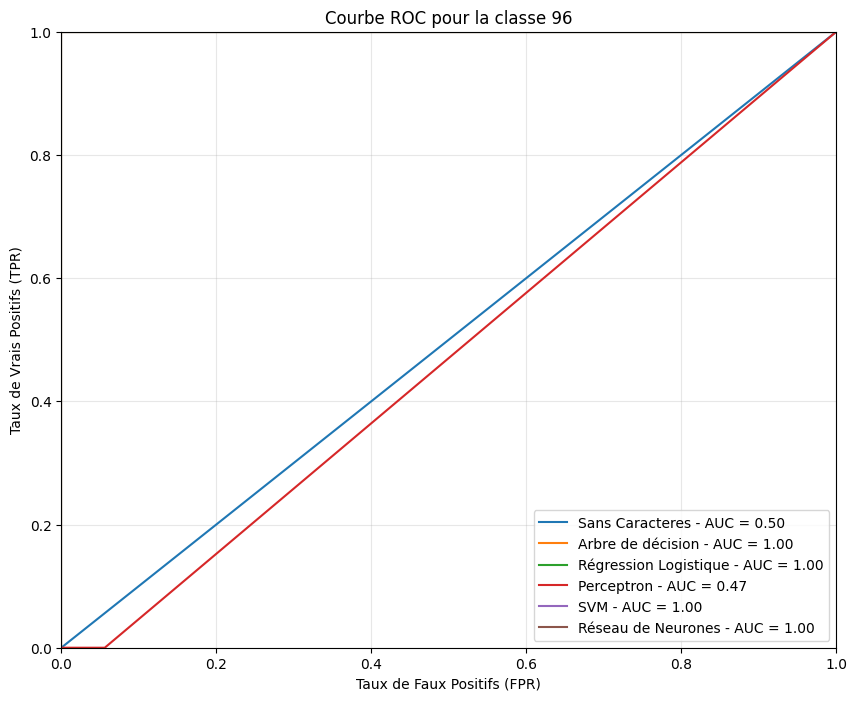

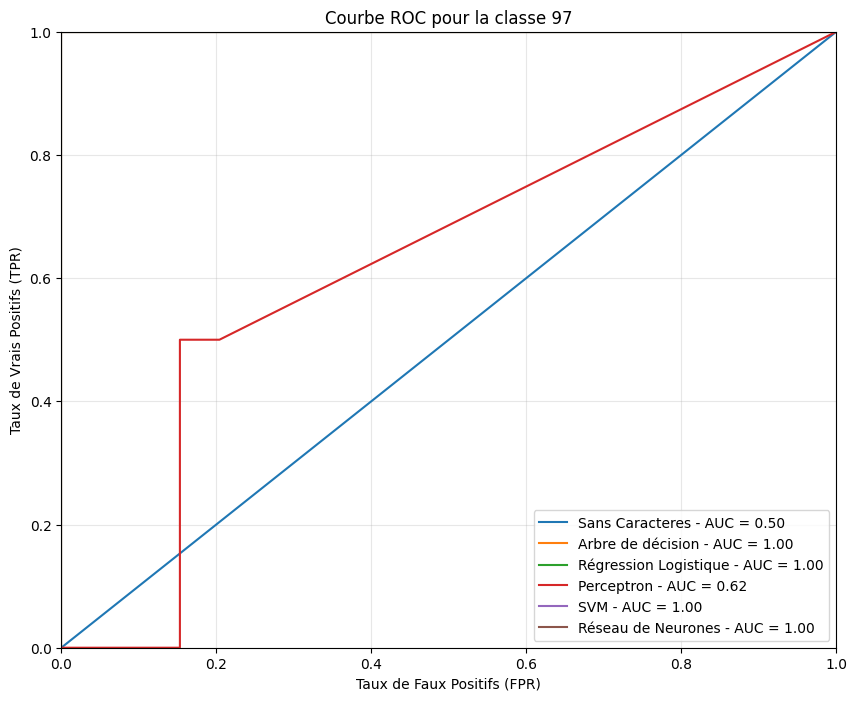

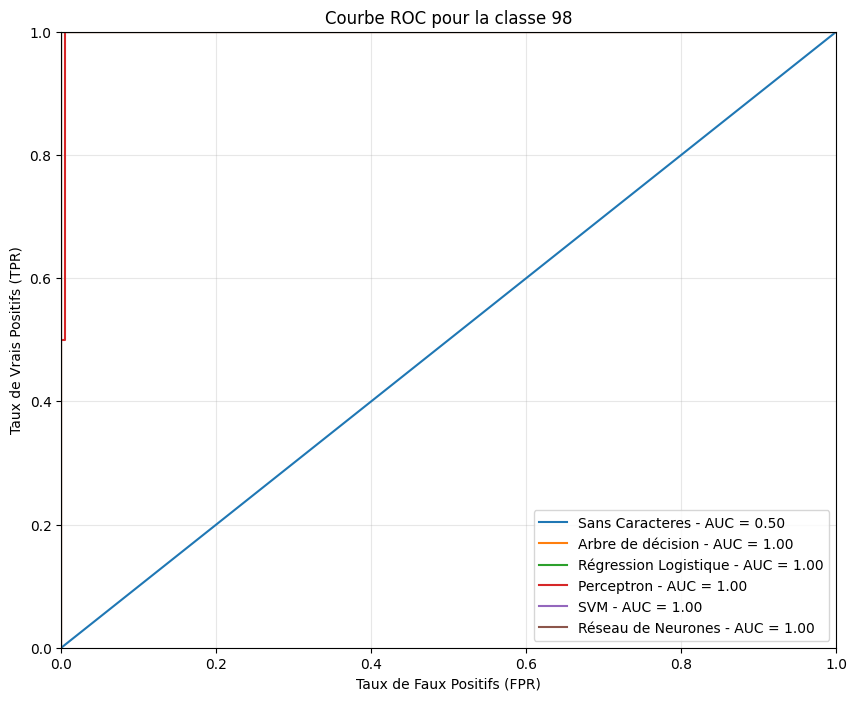

In [16]:
eval_algo_comparaison.roc_par_classe(y_test)